# Load

https://mapreader.readthedocs.io/en/latest/User-guide/Load.html

## Load in downloaded maps

In [1]:
# solve issue with autocomplete
%config Completer.use_jedi = False

%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from mapreader import loader

path2images = "./maps/*png"
my_files = loader(path2images)

In [3]:
# len() shows the total number of images currently read (or sliced, see below)
print(f"Number of images: {len(my_files)}")

Number of images: 2


In [4]:
print(my_files)

#images: 2

#parents: 2
map_74488689.png
map_101168192.png

#children: 0



In [5]:
path2metadata = "./maps/metadata.csv"
my_files.add_metadata(metadata=path2metadata)

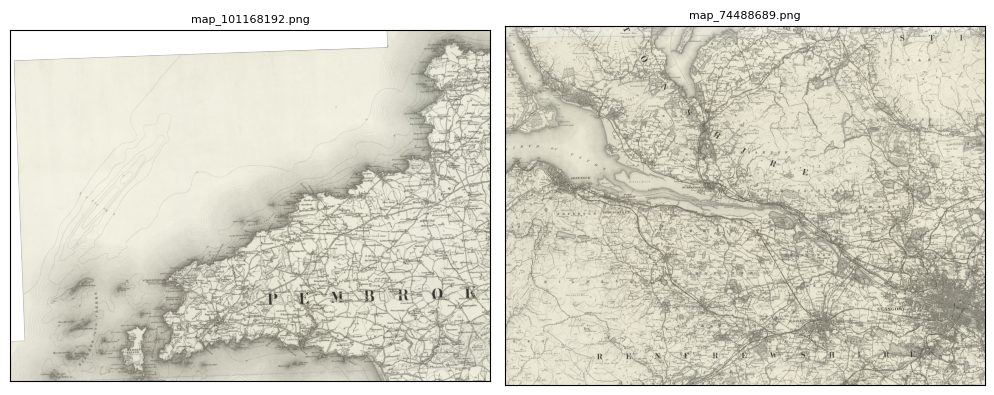

In [8]:
my_files.show_sample(num_samples=2, tree_level='parent')

In [6]:
parent_list=my_files.list_parents()

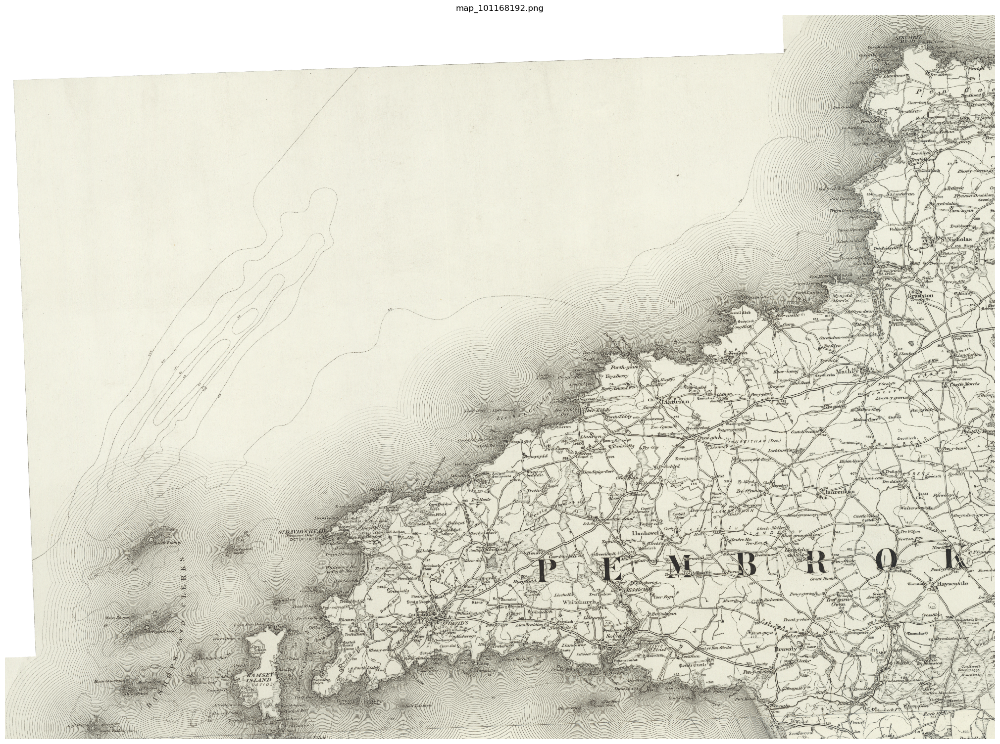

In [7]:
my_files.show(parent_list[1],
            tree_level='parent',
            figsize=(20, 20))

## Slice maps

In [9]:
my_files.sliceAll(path_save="./maps/slice_50_50", 
                slice_size=50, # in pixels
                square_cuts=False, 
                verbose=False)

Slicing maps/map_74488689.png
----------------------------------------
Slicing maps/map_101168192.png
----------------------------------------


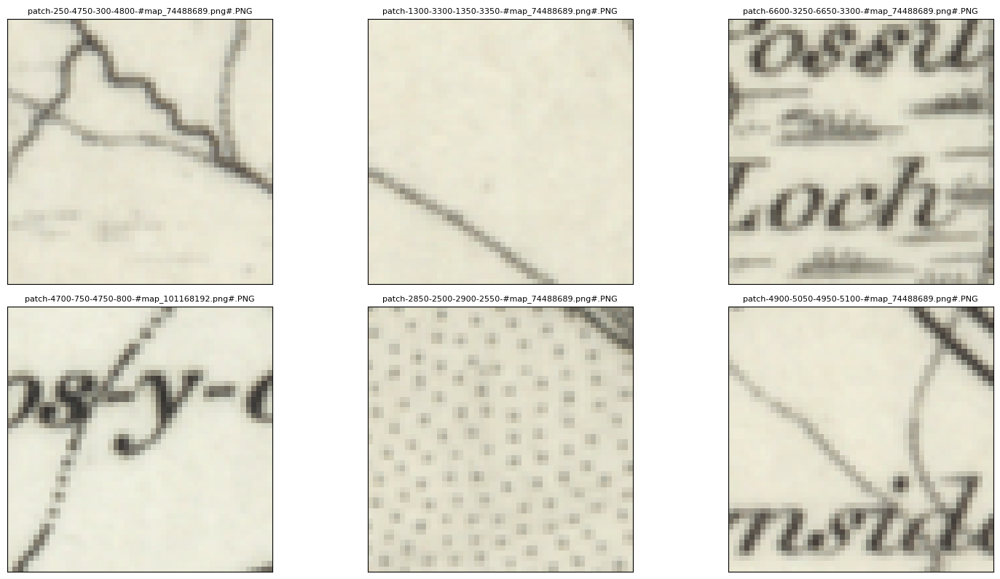

In [14]:
my_files.show_sample(num_samples=6, tree_level="child")

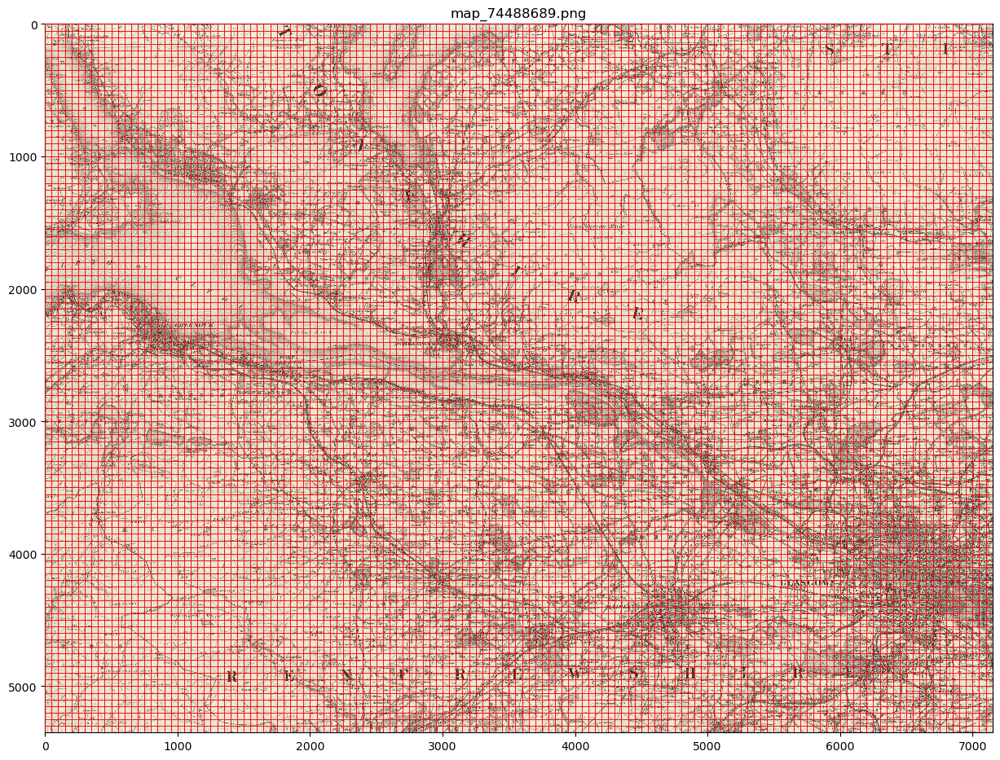

In [15]:
my_files.show_par(parent_list[0], 
                border=True, 
                plot_parent=True,
                figsize=(15, 15))

## Calculate pixel intensities

In [16]:
my_files.calc_pixel_stats()

----------
[INFO] calculate pixel stats for image: map_74488689.png
----------
[INFO] calculate pixel stats for image: map_101168192.png


In [17]:
parent_df, patch_df = my_files.convertImages()

In [18]:
parent_df.head()

,parent_id,image_path,name,url,coord,pub_date,region,polygone,children
map_74488689.png,None,/Users/rwood/LwM/MapReader/worked_examples/geo...,map_74488689.png,https://maps.nls.uk/view/74488689,"(-4.833984375, -4.21875, 55.80128097118045, 56...",1898,Glasgow (30),"[[-4.20999993, 55.79000003], [-4.82999994, 55....","[patch-0-0-50-50-#map_74488689.png#.PNG, patch..."
map_101168192.png,None,/Users/rwood/LwM/MapReader/worked_examples/geo...,map_101168192.png,https://maps.nls.uk/view/101168192,"(-5.44921875, -5.03173828125, 51.8493527637060...",1898,St David's (Outline),"[[-5.44556593, 52.02188069], [-5.02382714, 52....","[patch-0-0-50-50-#map_101168192.png#.PNG, patc..."


In [19]:
patch_df.head()

,parent_id,image_path,min_x,min_y,max_x,max_y,mean_pixel_R,mean_pixel_G,mean_pixel_B,mean_pixel_RGB,mean_pixel_A,std_pixel_R,std_pixel_G,std_pixel_B,std_pixel_RGB,std_pixel_A
patch-0-0-50-50-#map_74488689.png#.PNG,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,0,0,50,50,0.852102,0.844947,0.785391,0.827480,1.0,0.154845,0.158694,0.151317,0.157840,0.0
patch-50-0-100-50-#map_74488689.png#.PNG,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,50,0,100,50,0.892416,0.885853,0.823998,0.867422,1.0,0.053867,0.056206,0.055887,0.063335,0.0
patch-100-0-150-50-#map_74488689.png#.PNG,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,100,0,150,50,0.844464,0.838558,0.779729,0.820917,1.0,0.081002,0.085306,0.084227,0.088496,0.0
patch-150-0-200-50-#map_74488689.png#.PNG,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,150,0,200,50,0.738673,0.729583,0.673741,0.713999,1.0,0.163122,0.168806,0.162138,0.167198,0.0
patch-200-0-250-50-#map_74488689.png#.PNG,map_74488689.png,/Users/rwood/LwM/MapReader/worked_examples/geo...,200,0,250,50,0.785101,0.775573,0.716388,0.759021,1.0,0.159114,0.164475,0.159259,0.163814,0.0


In [40]:
patch_df.mean()

min_x             3193.048044
min_y             2370.646295
max_x             3243.048044
max_y             2420.646295
mean_pixel_R         0.791667
mean_pixel_G         0.781116
mean_pixel_B         0.716220
mean_pixel_RGB       0.763001
mean_pixel_A         0.977738
std_pixel_R          0.118752
std_pixel_G          0.120394
std_pixel_B          0.113254
std_pixel_RGB        0.124694
std_pixel_A          0.002544
dtype: float64

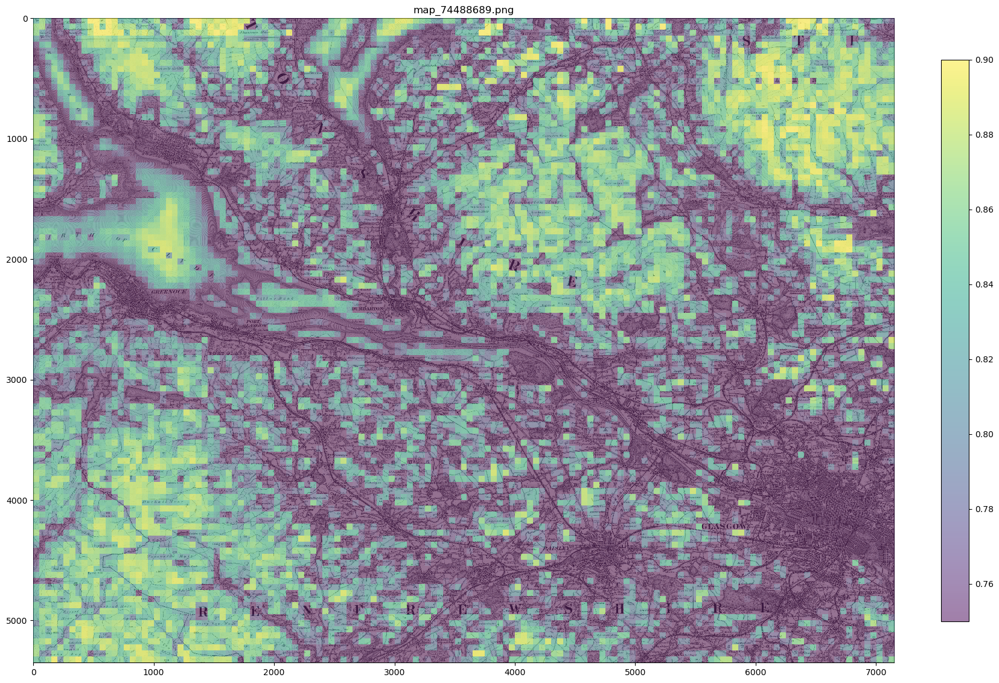

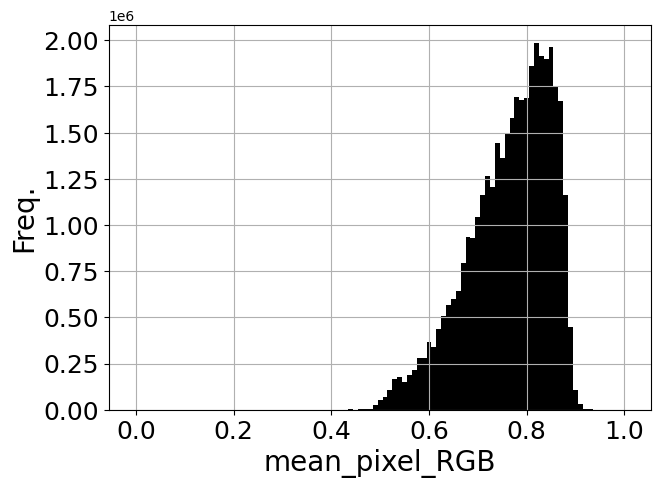

In [43]:
my_files.show_par(parent_list[0] ,
                value="mean_pixel_RGB",
                border=False,
                plot_parent=True,
                vmin=0.75, 
                vmax=0.9, 
                figsize=(20, 20),
                alpha=0.5, 
                colorbar="viridis")